In [ ]:
from google.colab import files
files.upload()

Saving Crimes_2001_to_present_sample.csv to Crimes_2001_to_present_sample.csv


{'Crimes_2001_to_present_sample.csv': b',ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location\r\n4506608,9878952,HX529642,12/04/2014 09:30:00 AM,010XX E 47TH ST,0497,BATTERY,AGGRAVATED DOMESTIC BATTERY: OTHER DANG WEAPON,APARTMENT,False,True,222,2.0,4.0,39.0,04B,1183896.0,1874058.0,2014,02/04/2016 06:33:39 AM,41.809596603,-87.60101633200001,"(41.809597, -87.601016)"\r\n561379,2514319,HH857213,12/24/2002 09:00:00 AM,055XX W CONGRESS PKWY,1320,CRIMINAL DAMAGE,TO VEHICLE,OTHER,False,True,1522,15.0,29.0,25.0,14,1139530.0,1897135.0,2002,04/15/2016 08:55:02 AM,41.873845465,-87.763183491,"(41.873845, -87.763183)"\r\n5058884,3891396,HL266026,03/31/2005 11:46:00 AM,050XX N KIMBALL AVE,141C,WEAPONS VIOLATION,UNLAWFUL USE OTHER DANG WEAPON,"SCHOOL, PUBLIC, GROUNDS",True,False,1713,17.0,39.0,13.0,15,1152801.0,1933422.0,2005,04/15/2016 08:55:02 AM,

In [ ]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
df=pd.read_csv('Crimes_2001_to_present_sample.csv')
df.head()

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,4506608,9878952,HX529642,12/04/2014 09:30:00 AM,010XX E 47TH ST,0497,BATTERY,AGGRAVATED DOMESTIC BATTERY: OTHER DANG WEAPON,APARTMENT,False,True,222,2.0,4.0,39.0,04B,1183896.0,1874058.0,2014,02/04/2016 06:33:39 AM,41.809597,-87.601016,"(41.809597, -87.601016)"
1,561379,2514319,HH857213,12/24/2002 09:00:00 AM,055XX W CONGRESS PKWY,1320,CRIMINAL DAMAGE,TO VEHICLE,OTHER,False,True,1522,15.0,29.0,25.0,14,1139530.0,1897135.0,2002,04/15/2016 08:55:02 AM,41.873845,-87.763183,"(41.873845, -87.763183)"
2,5058884,3891396,HL266026,03/31/2005 11:46:00 AM,050XX N KIMBALL AVE,141C,WEAPONS VIOLATION,UNLAWFUL USE OTHER DANG WEAPON,"SCHOOL, PUBLIC, GROUNDS",True,False,1713,17.0,39.0,13.0,15,1152801.0,1933422.0,2005,04/15/2016 08:55:02 AM,41.973168,-87.713495,"(41.973168, -87.713495)"
3,3619502,4983700,HM446634,06/30/2006 04:44:00 PM,034XX W CHICAGO AVE,2092,NARCOTICS,SOLICIT NARCOTICS ON PUBLICWAY,SIDEWALK,True,False,1121,11.0,27.0,23.0,26,1153483.0,1905125.0,2006,04/15/2016 08:55:02 AM,41.895505,-87.711742,"(41.895505, -87.711742)"
4,5533749,5284225,HM654977,10/11/2006 11:05:00 PM,007XX S CICERO AVE,1506,PROSTITUTION,SOLICIT ON PUBLIC WAY,STREET,True,False,1131,11.0,24.0,25.0,16,1144509.0,1896222.0,2006,04/15/2016 08:55:02 AM,41.871248,-87.744926,"(41.871248, -87.744926)"


In [ ]:
y=df['Arrest']
df=df.drop(columns=['Arrest','Unnamed: 0'])

In [ ]:
df.describe() # view the stats of dataset

,ID,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Latitude,Longitude
count,6.283300e+04,62833.000000,62833.000000,56698.000000,56685.000000,6.209600e+04,6.209600e+04,62833.000000,62096.000000,62096.000000
mean,5.867777e+06,1196.215476,11.317254,22.624749,37.638970,1.164606e+06,1.885466e+06,2007.656009,41.841312,-87.671478
std,2.821253e+06,706.948669,6.977605,13.809241,21.543534,1.748293e+04,3.325985e+04,4.504357,0.091538,0.063155
min,6.400000e+02,111.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000e+00,2001.000000,36.619446,-91.686566
25%,3.288356e+06,622.000000,6.000000,10.000000,23.000000,1.152980e+06,1.858961e+06,2004.000000,41.768407,-87.713672
50%,5.827064e+06,1111.000000,10.000000,22.000000,32.000000,1.166020e+06,1.890045e+06,2007.000000,41.853838,-87.666073
75%,8.313928e+06,1733.000000,17.000000,34.000000,58.000000,1.176386e+06,1.909423e+06,2011.000000,41.907129,-87.628203
max,1.087019e+07,2535.000000,25.000000,50.000000,77.000000,1.205119e+06,1.951573e+06,2017.000000,42.022710,-87.524529


In [ ]:
!wget http://bostonopendata-boston.opendata.arcgis.com/datasets/142500a77e2a4dbeb94a86f7e0b568bc_9.zip?outSR={%22latestWkid%22:2249,%22wkid%22:102686}

In [ ]:
df['Primary Type'].value_counts().iloc[:10] # getting the top 1o incidents

THEFT                  13015
BATTERY                11508
CRIMINAL DAMAGE         7215
NARCOTICS               6934
OTHER OFFENSE           3880
ASSAULT                 3834
BURGLARY                3684
MOTOR VEHICLE THEFT     2927
ROBBERY                 2338
DECEPTIVE PRACTICE      2320
Name: Primary Type, dtype: int64

Text(0.5, 1.0, 'Mostly Occured incidents')

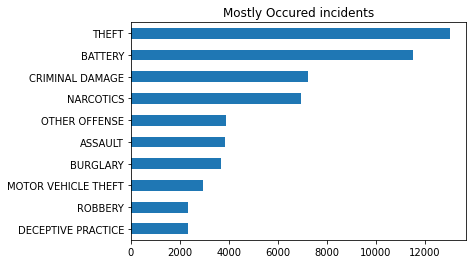

In [ ]:
most_common_crimes=df['Primary Type'].value_counts().iloc[:10].sort_values().plot(kind= 'barh')
plt.title('Mostly Occured incidents')


In [ ]:
df.isnull().sum() # checking for null values

Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Domestic                0
Beat                    0
District                0
Ward                    0
Community Area          0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
dtype: int64

In [ ]:
df=df.drop(columns=['ID',])
df=df.fillna(method='ffill')
df.isnull().sum()

KeyError: ignored

In [ ]:
!pip install geopandas
!pip install folium

In [ ]:
import geopandas as gpd
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [ ]:
# Create a map
m_1 = folium.Map(location=[41.809597,	-87.601016], tiles='openstreetmap', zoom_start=10)

# Display the map
m_1

In [ ]:
daytime_thefts= df[((df['Primary Type'] == 'THEFT'))]

In [ ]:
# Create a map
m_2 = folium.Map(location=[41.809597,	-87.601016], tiles='cartodbpositron',zoom_start=12)

# Add points to the map
for idx, row in daytime_thefts.iterrows():
    Marker([row['Latitude'], row['Longitude']]).add_to(m_2)


# Display the map
m_2

In [ ]:
df.groupby('Description').size().sort_values(ascending = False).iloc[:10] # getting the top 10 streets

Description
SIMPLE                          7434
$500 AND UNDER                  5036
DOMESTIC BATTERY SIMPLE         4875
TO VEHICLE                      3505
TO PROPERTY                     3288
OVER $500                       3106
POSS: CANNABIS 30GMS OR LESS    2771
FORCIBLE ENTRY                  2520
AUTOMOBILE                      2260
FROM BUILDING                   2193
dtype: int64

Text(0.5, 1.0, 'Mostly occured incidents description')

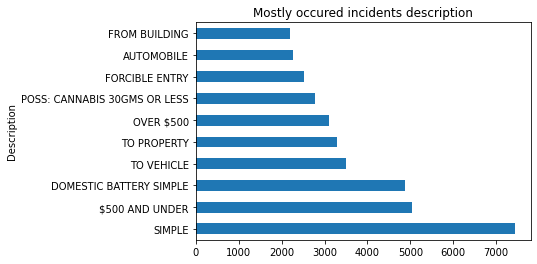

In [ ]:
df.groupby('Description').size().sort_values(ascending = False).iloc[:10].plot(kind='barh')
plt.title('Mostly occured incidents description')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62833 entries, 0 to 62832
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Case Number           62833 non-null  object 
 1   Date                  62833 non-null  object 
 2   Block                 62833 non-null  object 
 3   IUCR                  62833 non-null  object 
 4   Primary Type          62833 non-null  object 
 5   Description           62833 non-null  object 
 6   Location Description  62833 non-null  object 
 7   Domestic              62833 non-null  bool   
 8   Beat                  62833 non-null  int64  
 9   District              62833 non-null  float64
 10  Ward                  62833 non-null  float64
 11  Community Area        62833 non-null  float64
 12  FBI Code              62833 non-null  object 
 13  X Coordinate          62833 non-null  float64
 14  Y Coordinate          62833 non-null  float64
 15  Year               

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
objList = df.select_dtypes(include = "object").columns

for col in objList:
    df[col] = le.fit_transform(df[col].astype(str))

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62833 entries, 0 to 62832
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Case Number           62833 non-null  int64  
 1   Date                  62833 non-null  int64  
 2   Block                 62833 non-null  int64  
 3   IUCR                  62833 non-null  int64  
 4   Primary Type          62833 non-null  int64  
 5   Description           62833 non-null  int64  
 6   Location Description  62833 non-null  int64  
 7   Domestic              62833 non-null  bool   
 8   Beat                  62833 non-null  int64  
 9   District              62833 non-null  float64
 10  Ward                  62833 non-null  float64
 11  Community Area        62833 non-null  float64
 12  FBI Code              62833 non-null  int64  
 13  X Coordinate          62833 non-null  float64
 14  Y Coordinate          62833 non-null  float64
 15  Year               

In [ ]:
df.head()

,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,56893,56547,3386,52,2,19,14,True,222,2.0,4.0,39.0,4,1183896.0,1874058.0,2014,64,41.809597,-87.601016,20928
1,9631,59428,15587,135,5,254,71,True,1522,15.0,29.0,25.0,15,1139530.0,1897135.0,2002,207,41.873845,-87.763183,27646
2,20017,14256,14236,147,28,269,90,False,1713,17.0,39.0,13.0,16,1152801.0,1933422.0,2005,207,41.973168,-87.713495,46099
3,25697,29744,10779,234,16,232,91,False,1121,11.0,27.0,23.0,24,1153483.0,1905125.0,2006,207,41.895505,-87.711742,33284
4,27064,47800,2566,156,22,234,94,False,1131,11.0,24.0,25.0,17,1144509.0,1896222.0,2006,207,41.871248,-87.744926,27137


In [ ]:
df['Domestic'].dtype

dtype('bool')

In [ ]:
le = LabelEncoder()
objList = df.select_dtypes(include = "bool").columns

for col in objList:
    df[col] = le.fit_transform(df[col].astype(str))

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62833 entries, 0 to 62832
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Case Number           62833 non-null  int64  
 1   Date                  62833 non-null  int64  
 2   Block                 62833 non-null  int64  
 3   IUCR                  62833 non-null  int64  
 4   Primary Type          62833 non-null  int64  
 5   Description           62833 non-null  int64  
 6   Location Description  62833 non-null  int64  
 7   Domestic              62833 non-null  int64  
 8   Beat                  62833 non-null  int64  
 9   District              62833 non-null  float64
 10  Ward                  62833 non-null  float64
 11  Community Area        62833 non-null  float64
 12  FBI Code              62833 non-null  int64  
 13  X Coordinate          62833 non-null  float64
 14  Y Coordinate          62833 non-null  float64
 15  Year               

In [ ]:
df.head()

,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,56893,56547,3386,52,2,19,14,1,222,2.0,4.0,39.0,4,1183896.0,1874058.0,2014,64,41.809597,-87.601016,20928
1,9631,59428,15587,135,5,254,71,1,1522,15.0,29.0,25.0,15,1139530.0,1897135.0,2002,207,41.873845,-87.763183,27646
2,20017,14256,14236,147,28,269,90,0,1713,17.0,39.0,13.0,16,1152801.0,1933422.0,2005,207,41.973168,-87.713495,46099
3,25697,29744,10779,234,16,232,91,0,1121,11.0,27.0,23.0,24,1153483.0,1905125.0,2006,207,41.895505,-87.711742,33284
4,27064,47800,2566,156,22,234,94,0,1131,11.0,24.0,25.0,17,1144509.0,1896222.0,2006,207,41.871248,-87.744926,27137


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
cols=df.columns
data_scaled=scaler.fit_transform(df.values)
df_scaled=pd.DataFrame(data=data_scaled,columns=cols)
df_scaled.head()

,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,0.905478,0.936023,0.150002,0.172757,0.071429,0.068100,0.138614,1.0,0.045792,0.041667,0.061224,0.506494,0.166667,0.982389,0.960281,0.8125,0.086253,0.960558,0.981623,0.426328
1,0.153282,0.983712,0.690515,0.448505,0.178571,0.910394,0.702970,1.0,0.582096,0.583333,0.571429,0.324675,0.625000,0.945575,0.972106,0.0625,0.278976,0.972449,0.942659,0.563181
2,0.318580,0.235980,0.630665,0.488372,1.000000,0.964158,0.891089,0.0,0.660891,0.666667,0.775510,0.168831,0.666667,0.956587,0.990699,0.2500,0.278976,0.990831,0.954598,0.939090
3,0.408980,0.492353,0.477517,0.777409,0.571429,0.831541,0.900990,0.0,0.416667,0.416667,0.530612,0.298701,1.000000,0.957153,0.976200,0.3125,0.278976,0.976458,0.955019,0.678034
4,0.430736,0.791234,0.113676,0.518272,0.785714,0.838710,0.930693,0.0,0.420792,0.416667,0.469388,0.324675,0.708333,0.949706,0.971638,0.3125,0.278976,0.971968,0.947046,0.552812


Text(0.5, 1.0, 'Correlation between variables')

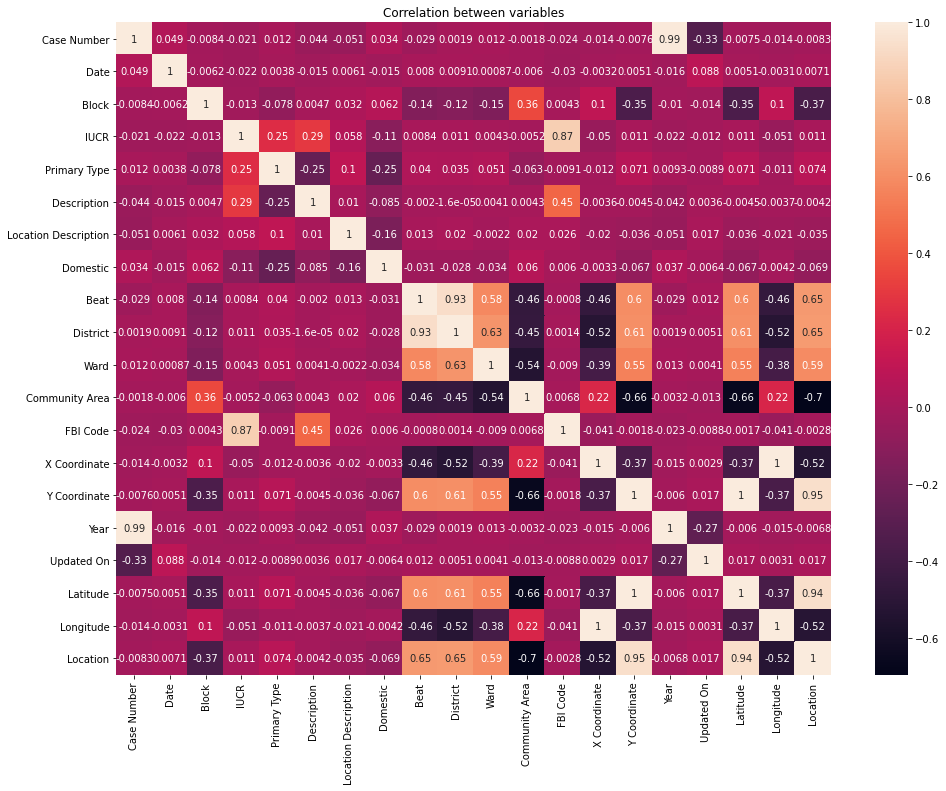

In [ ]:
fig=plt.figure(figsize=(16,12))
sns.heatmap(df.corr(),annot=True)
plt.title('Correlation between variables')

In [ ]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()
y=enc.fit_transform(y)
y

array([0, 0, 1, ..., 0, 0, 0])

In [ ]:
print(f' the input shape is {df_scaled.shape},output shape is {y.shape}')

 the input shape is (62833, 20),output shape is (62833,)


In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(df_scaled,y,test_size=0.2,random_state=42)
print(f'X_Train size is {X_train.shape}, y train size is {y_train.shape}')

X_Train size is (50266, 20), y train size is (50266,)


Confusion Matrix 
[[8258  754]
 [1986 1569]]


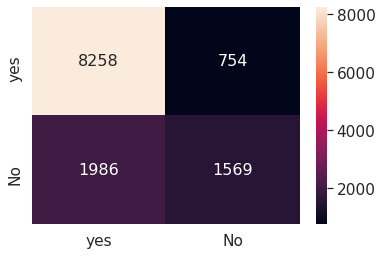

Logistic Regression accuracy : 0.7819686480464709


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
lr=LogisticRegression()
lr.fit(X_train,y_train)
y_lr_pred=lr.predict(X_test)
print('Confusion Matrix ')
arr=(confusion_matrix(y_test,y_lr_pred))
print(arr)
df_cm = pd.DataFrame(arr, ['yes','No'], ['yes','No'])
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},fmt='g') # font size

plt.show()
lr_acc=lr.score(X_test,y_test)
print('Logistic Regression accuracy :',lr_acc)

Confusion Matrix 
[[8714  298]
 [1172 2383]]


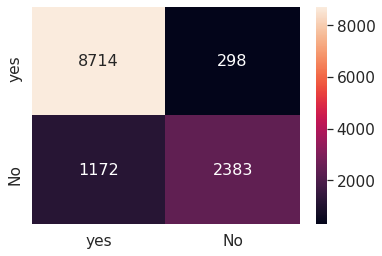

Random Forest Accuracy : 0.8830269754117928


In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train,y_train)
y_rf_pred=rf.predict(X_test)
print('Confusion Matrix ')
arr=(confusion_matrix(y_test,y_rf_pred))
print(arr)
df_cm = pd.DataFrame(arr, ['yes','No'], ['yes','No'])
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},fmt='g') # font size

plt.show()
rf_acc=rf.score(X_test,y_test)
print('Random Forest Accuracy :',rf_acc)

Confusion Matrix 
[[8813  199]
 [1526 2029]]


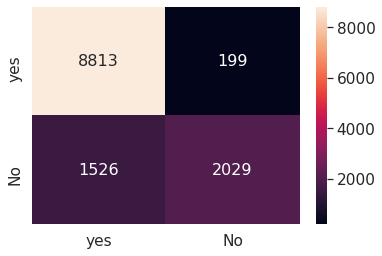

SVM accuracy : 0.862735736452614


In [ ]:
from sklearn.svm import SVC
svc=SVC()
svc.fit(X_train,y_train)
y_svm_pred=svc.predict(X_test)
print('Confusion Matrix ')

arr=(confusion_matrix(y_test,y_svm_pred))
print(arr)
df_cm = pd.DataFrame(arr, ['yes','No'], ['yes','No'])
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},fmt='g') # font size

plt.show()
svm_acc=svc.score(X_test,y_test)
print('SVM accuracy :',svm_acc)

Confusion Matrix 
[[8443  569]
 [1347 2208]]
<class 'numpy.ndarray'>


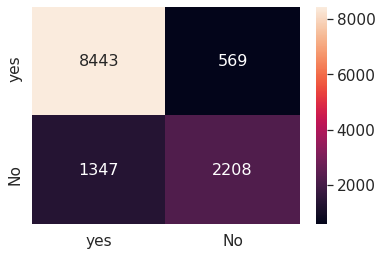

KNeighborsClassifier Accuracy : 0.8163443940479033


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()
knn.fit(X_train,y_train)
y_knn_pred=knn.predict(X_test)
print('Confusion Matrix ')
arr=(confusion_matrix(y_test,y_knn_pred))
print(arr)
print(type(arr))
arr=arr.astype('float64')
df_cm = pd.DataFrame(arr, ['yes','No'], ['yes','No'])
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},fmt='g') # font size

plt.show()
knn_acc=knn.score(X_test,y_test)
print('KNeighborsClassifier Accuracy :',cart_acc)

Confusion Matrix 
[[7480 1532]
 [1365 2190]]
<class 'numpy.ndarray'>


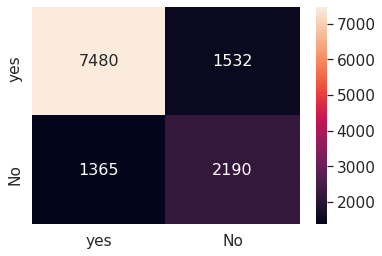

Naive Bayes Classifier Accuracy : 0.8163443940479033


In [ ]:
from sklearn.naive_bayes import GaussianNB
NB=GaussianNB()
NB.fit(X_train,y_train)
y_nb_pred=NB.predict(X_test)
print('Confusion Matrix ')
arr=(confusion_matrix(y_test,y_nb_pred))
print(arr)
print(type(arr))
arr=arr.astype('float64')
df_cm = pd.DataFrame(arr, ['yes','No'], ['yes','No'])
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},fmt='g') # font size

plt.show()
nb_acc=NB.score(X_test,y_test)
print('Naive Bayes Classifier Accuracy :',cart_acc)

Confusion Matrix 
[[7760 1252]
 [1056 2499]]
<class 'numpy.ndarray'>


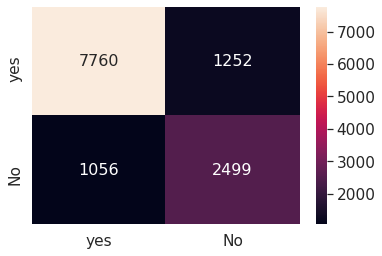

DecisionTreeClassifier Accuracy : 0.8163443940479033


In [ ]:
from sklearn.tree import DecisionTreeClassifier
cart=DecisionTreeClassifier()
cart.fit(X_train,y_train)
y_cart_pred=cart.predict(X_test)
print('Confusion Matrix ')
arr=(confusion_matrix(y_test,y_cart_pred))
print(arr)
print(type(arr))
arr=arr.astype('float64')
df_cm = pd.DataFrame(arr, ['yes','No'], ['yes','No'])
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16},fmt='g') # font size

plt.show()
cart_acc=cart.score(X_test,y_test)
print('DecisionTreeClassifier Accuracy :',cart_acc)

Text(0, 0.5, 'Accuracy')

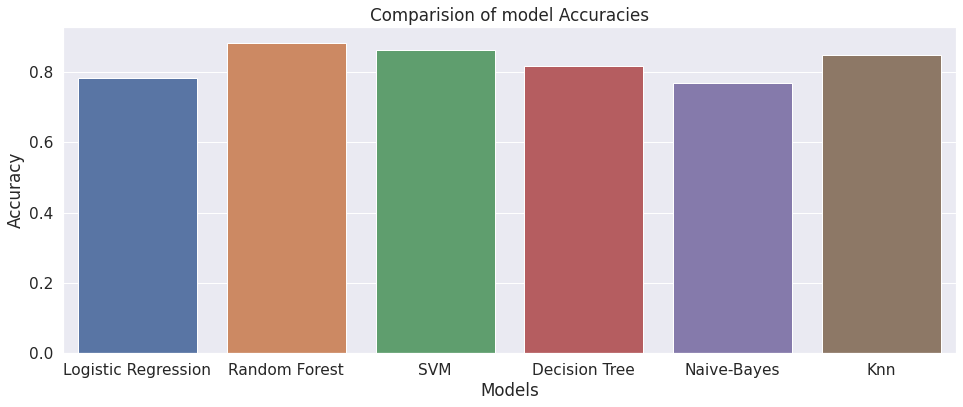

In [ ]:
res=pd.DataFrame(data=[[lr_acc,rf_acc,svm_acc,cart_acc,nb_acc,knn_acc]],columns=['Logistic Regression','Random Forest','SVM','Decision Tree','Naive-Bayes','Knn'])
fig=plt.figure(figsize=(16,6))
sns.barplot(data=res)
plt.title('Comparision of model Accuracies')
plt.xlabel('Models')
plt.ylabel('Accuracy')

In [ ]:

'''
location_of_most_common_crimes = df[df.OFFENSE_DESCRIPTION.isin(most_common_crimes.index)].loc[:, ['Lat', 'Long']].dropna()

my_map=folium.Map(location = [42.320,-71.05], #Initiate map on Boston city
                  zoom_start = 11,
                  min_zoom = 11
)

HeatMap(data=location_of_most_common_crimes.sample(100), radius=16).add_to(my_map)

my_map '''

"\nlocation_of_most_common_crimes = df[df.OFFENSE_DESCRIPTION.isin(most_common_crimes.index)].loc[:, ['Lat', 'Long']].dropna()\n\nmy_map=folium.Map(location = [42.320,-71.05], #Initiate map on Boston city\n                  zoom_start = 11,\n                  min_zoom = 11\n)\n\nHeatMap(data=location_of_most_common_crimes.sample(100), radius=16).add_to(my_map)\n\nmy_map "